In [1]:
%matplotlib inline

from datetime import datetime
tic = datetime.now()

import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

# THIS_DIR = getcwd()
# CLASS_DIR = abspath(join(THIS_DIR, 'dsnclasses'))  #abspath(join(THIS_DIR, '../../..', 'dsnclasses'))
# sys.path.append(CLASS_DIR)

In [2]:
import random
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import torch
from IPython.display import clear_output

In [3]:
seed = 161
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [4]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] < tot_day_radiation <= bin_edges[k]):
                day_state = k -1
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [5]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 9250.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.95*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the mean battery level for each day
        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location = location
        self.year = year
        self.shuffle = shuffle
        self.trainmode = trainmode
        self.eno = None#ENO(self.location, self.year, shuffle=shuffle, day_balance=trainmode) #if trainmode is enable, then days are automatically balanced according to daytype i.e. day_balance= True
        
        self.day_violation_flag = False
        self.violation_flag = False
        self.violation_counter = 0
        
        self.batt_violations = 0

        self.NO_OF_DAYTYPE = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt = self.batt/self.BMAX
        norm_enp = self.enp/(self.BMAX/2)
        norm_henergy = self.henergy/self.HMAX
        norm_fcast = self.fcast/(self.NO_OF_DAYTYPE-1)

        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt = self.batt/self.BMAX - self.MUBATT
        norm_enp = self.enp/(self.BMAX/2)
        norm_henergy = self.henergy/self.HMAX
        norm_fcast = self.fcast/(self.NO_OF_DAYTYPE-1)        
        c_state = [norm_batt, norm_enp, norm_henergy] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        bmean = np.mean(self.btrack)
        reward = 0
        violation_penalty = 0
        bdev = np.abs(self.BOPT - bmean)

        if (bmean<self.BLIM_LO and self.enp<0): #if battery is outside critical limits
            reward += -4 - 6*(-self.enp/self.BMAX)*2*(bdev/self.BMAX) #punish enp violations severely depending on the virtual ENP
        
        elif (bmean>self.BLIM_HI and self.enp>0): #if battery is outside critical limits
            reward += -4 - 6*(self.enp/self.BMAX)*2*(bdev/self.BMAX) #punish enp violations severely depending on the virtual ENP

        else: #if battery is within critical limits
            # based on the sigmoid function
            sharpness = 80
            if(bdev<self.ENP_MARGIN/2): 
                r = 1 - 2/ (1 + np.exp(-sharpness*(bdev - self.ENP_MARGIN/2)/self.BMAX))
            else: 
                r= -1 - 10*(bdev-self.ENP_MARGIN/2)/self.BMAX
            reward += r
            if (bmean>self.BSAFE_LO and bmean<self.BSAFE_HI and np.abs(self.enp)<=self.ENP_MARGIN): #if enp is within limits
                bonus = 1-(10/3)*np.abs(self.enp)/self.BMAX #bonus varies from 0 to 1 as enp changes from 0 to ENP_MARGIN
                reward = reward*3**bonus
            else:
                reward = reward #if no bonus, reward varies from 1 to -1 within critical limits

        #REWARD AS A FUNCTION OF BATTERY VIOLATIONS
        if(self.day_violation_flag):
            violation_penalty = 6    #penalty for violating battery limits anytime during the day
        
        return (reward - violation_penalty)
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

        action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
        reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
            reward -= 3
            if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
                reward -= 3
            
        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels


        
        #proceed to the next time step
        self.enp = self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
        
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        

                
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
             
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
            
                    
                
        norm_batt = self.batt/self.BMAX
        norm_enp = self.enp/(self.BMAX/2)
        norm_henergy = self.henergy/self.HMAX
        norm_fcast = self.fcast/(self.NO_OF_DAYTYPE-1)

        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        return [c_state, reward, day_end, year_end]

In [6]:
# Hyper Parameters
BATCH_SIZE = 32
LR = 1E-5          # learning rate
EPSILON = 0.9               # greedy policy
GAMMA = 0.9                 # reward discount
LAMBDA = 0.95                # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18    # target update frequency (every two months)
MEMORY_CAPACITY     = 24*7*4*12*2      # store upto six month worth of memory   

N_ACTIONS = 10 #no. of duty cycles (0,1,2,3,4)
N_STATES = 4 #number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER = 20
NO_OF_ITERATIONS = 50
GPU = False
HELP = 0.05

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)
        
        self.fc2 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
        nn.init.xavier_uniform_(self.fc2.weight)
        
        self.fc3 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc3.weight)

        self.out = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.out.weight) 

    
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = F.sigmoid(x)
        x = self.fc3(x)
        x = F.relu(x)
        actions_value = self.out(x)
        return actions_value
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=1e-3)
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if np.random.uniform() < EPSILON:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        else:   # random
            action = np.random.randint(0, N_ACTIONS)
            action = action
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

In [8]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.15
    
    MU_ENP = 0
    SD_ENP = 0.15
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.25
    
    MU_FCAST = 0.42
    SD_FCAST = 0.27
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt = (norm_batt - MU_BATT)/SD_BATT
    std_enp = (norm_enp - MU_ENP)/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY)/SD_HENERGY
    std_fcast = (norm_fcast - MU_FCAST)/SD_FCAST


    return [std_batt, std_enp, std_henergy, std_fcast]



TRAINING IN PROGRESS

Device:  cpu

EPSILON = 0.9
Iteration 0:  TOKYO, 2008 
Average Reward 		= -13.558
Battery Violations 	= 3427
Action Mean = 5.059
Action variance = 0.935


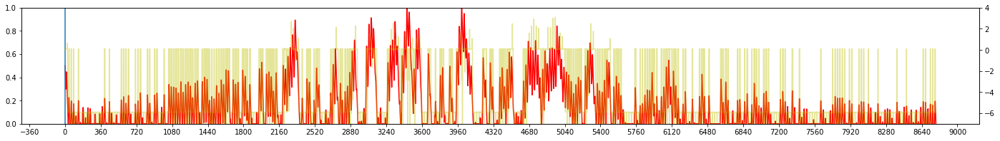

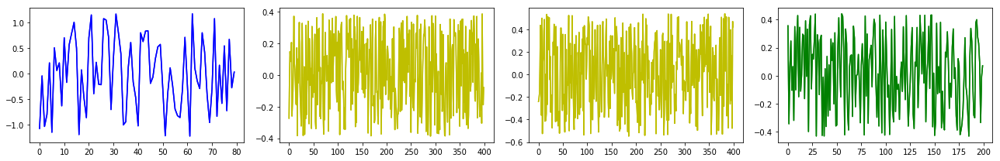


EPSILON = 0.9
Iteration 1:  TOKYO, 2003 
Average Reward 		= -14.469
Battery Violations 	= 3806
Action Mean = 5.068
Action variance = 0.919


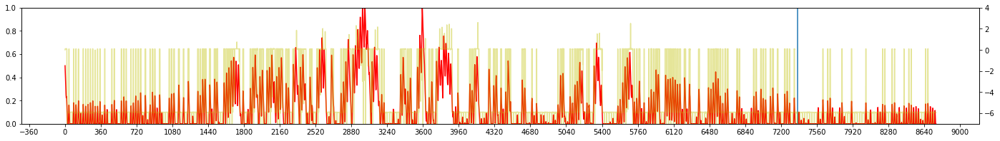

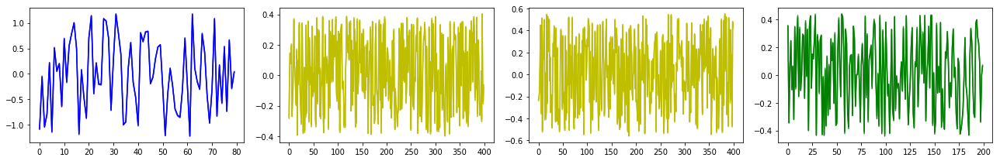


EPSILON = 0.9
Iteration 2:  TOKYO, 2008 
Average Reward 		= -8.977
Battery Violations 	= 1553
Action Mean = 3.336
Action variance = 1.533


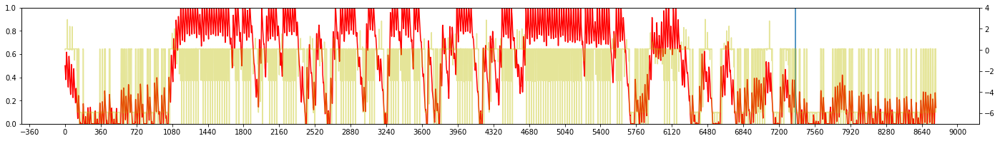

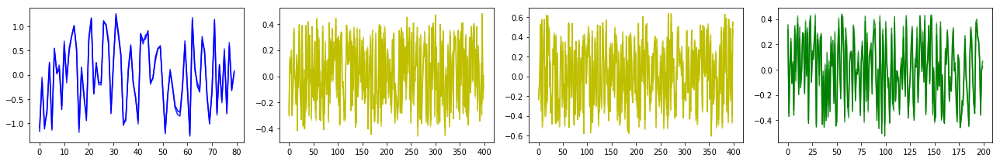


EPSILON = 0.9
Iteration 3:  TOKYO, 2002 
Average Reward 		= -13.811
Battery Violations 	= 3378
Action Mean = 4.031
Action variance = 10.070


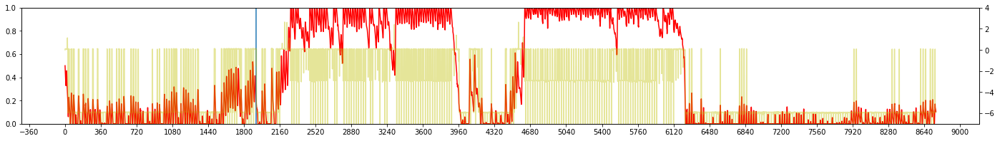

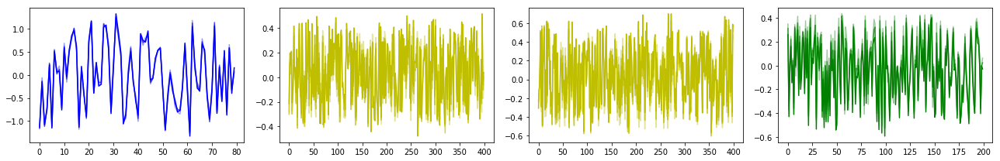


EPSILON = 0.9
Iteration 4:  TOKYO, 2003 
Average Reward 		= -12.855
Battery Violations 	= 3177
Action Mean = 4.208
Action variance = 6.599


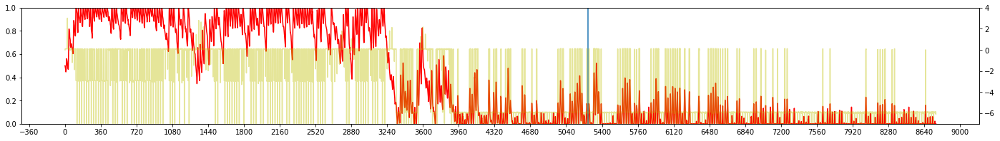

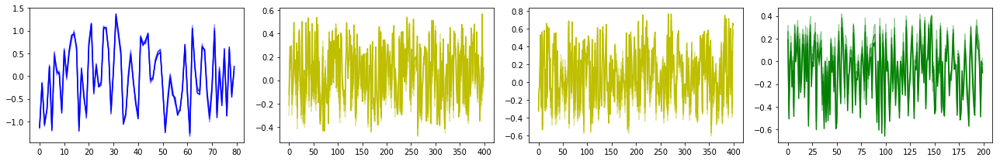


EPSILON = 0.9
Iteration 5:  TOKYO, 2009 
Average Reward 		= -15.413
Battery Violations 	= 3502
Action Mean = 5.087
Action variance = 8.580


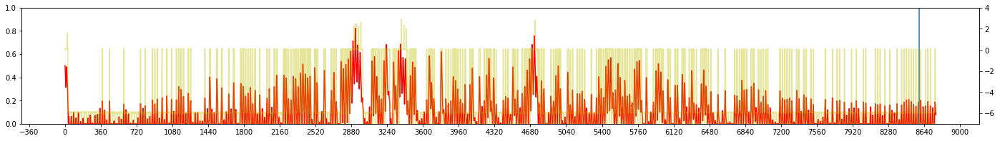

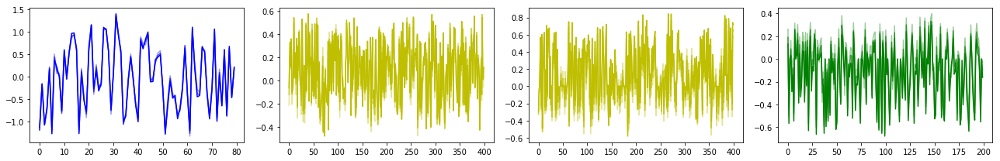


EPSILON = 0.9
Iteration 6:  TOKYO, 2007 
Average Reward 		= -12.656
Battery Violations 	= 3148
Action Mean = 5.178
Action variance = 5.737


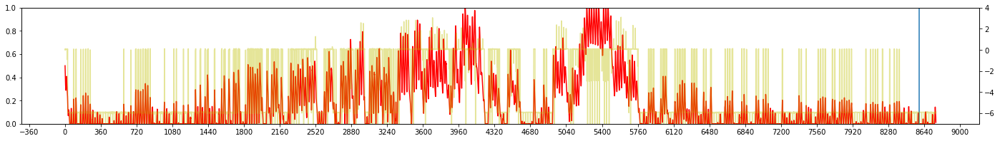

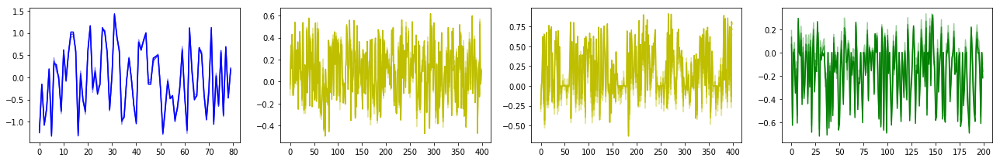


EPSILON = 0.9
Iteration 7:  TOKYO, 2000 
Average Reward 		= -13.362
Battery Violations 	= 3246
Action Mean = 4.822
Action variance = 2.270


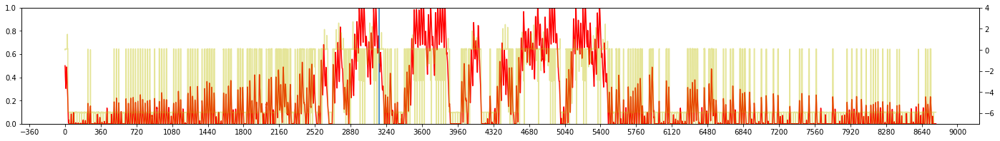

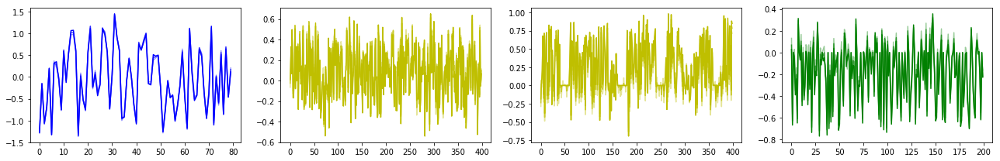


EPSILON = 0.9
Iteration 8:  TOKYO, 2007 
Average Reward 		= -11.316
Battery Violations 	= 2127
Action Mean = 4.096
Action variance = 3.499


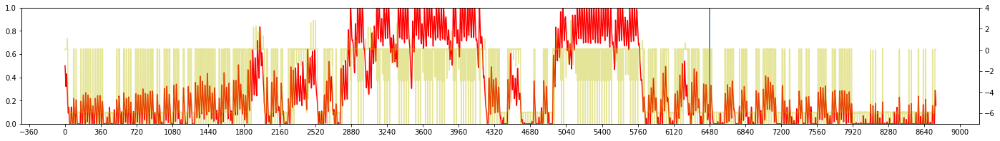

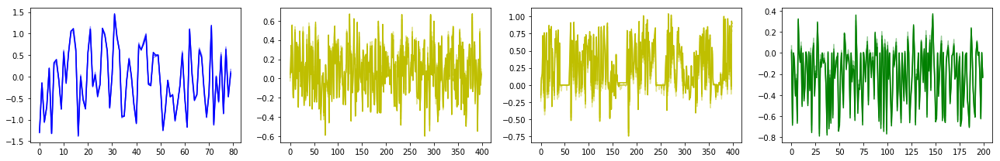


EPSILON = 0.9
Iteration 9:  TOKYO, 2007 
Average Reward 		= -12.654
Battery Violations 	= 1968
Action Mean = 4.334
Action variance = 7.943


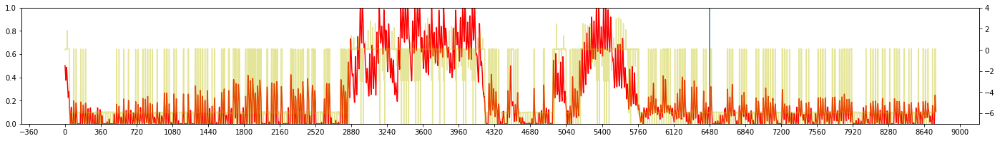

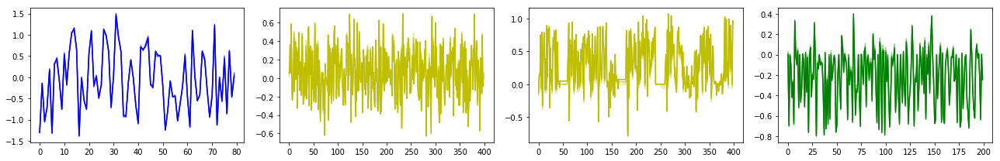


EPSILON = 0.9
Iteration 10:  TOKYO, 2000 
Average Reward 		= -13.698
Battery Violations 	= 2615
Action Mean = 4.750
Action variance = 7.321


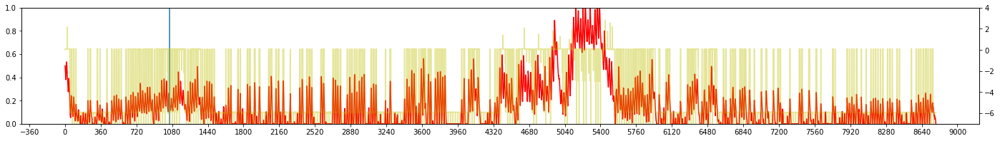

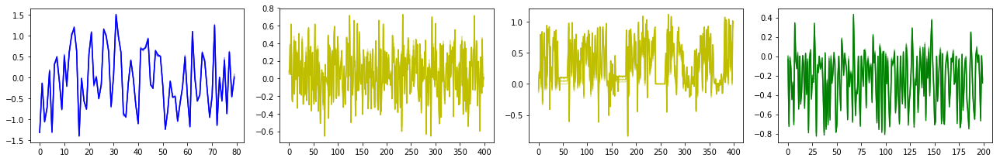


EPSILON = 0.9
Iteration 11:  TOKYO, 2007 
Average Reward 		= -6.004
Battery Violations 	= 560
Action Mean = 3.412
Action variance = 4.081


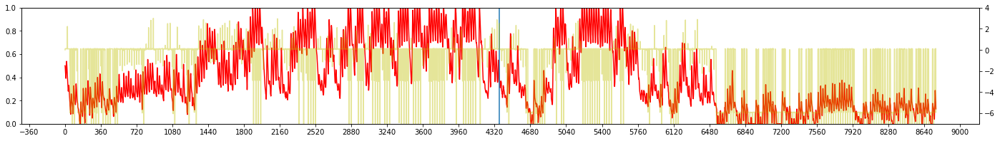

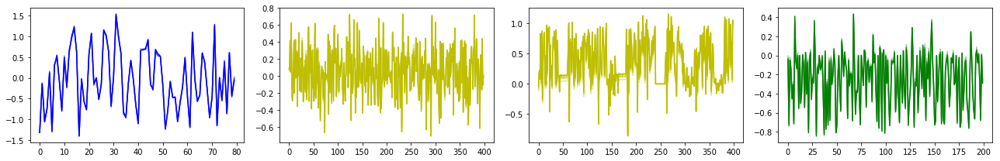


EPSILON = 0.9
Iteration 12:  TOKYO, 2000 
Average Reward 		= -2.961
Battery Violations 	= 238
Action Mean = 3.240
Action variance = 3.917


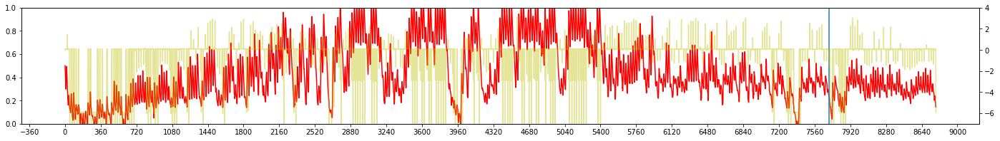

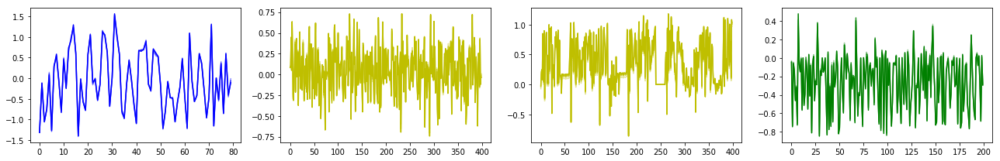


EPSILON = 0.9
Iteration 13:  TOKYO, 2007 
Average Reward 		= -3.316
Battery Violations 	= 268
Action Mean = 3.491
Action variance = 5.791


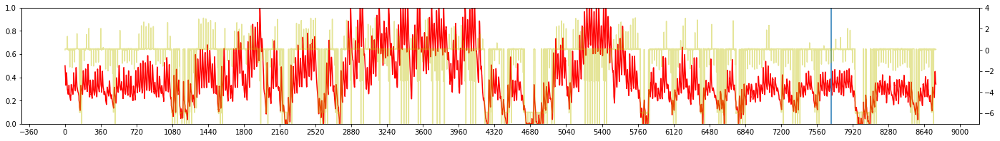

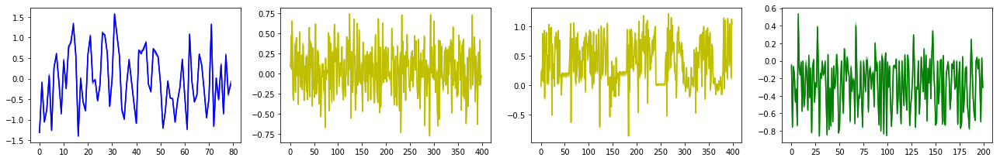


EPSILON = 0.9
Iteration 14:  TOKYO, 2009 
Average Reward 		= -1.073
Battery Violations 	= 98
Action Mean = 3.301
Action variance = 5.775


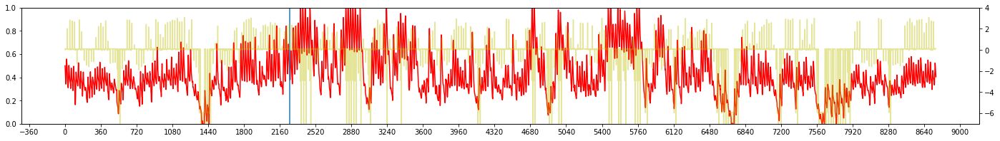

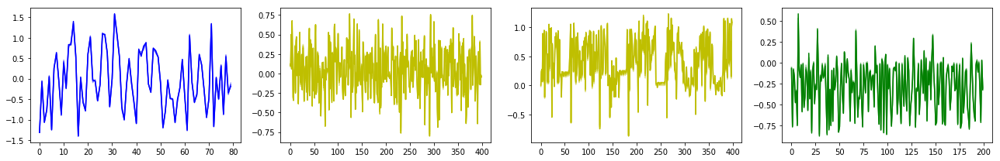


EPSILON = 0.9
Iteration 15:  TOKYO, 2001 
Average Reward 		= -2.675
Battery Violations 	= 440
Action Mean = 3.013
Action variance = 3.983


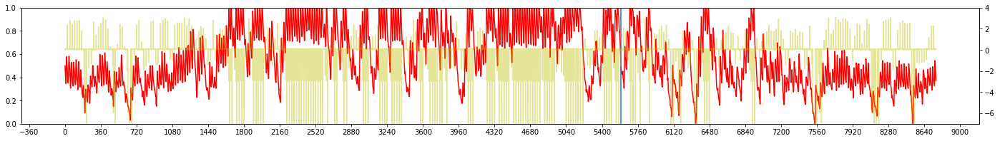

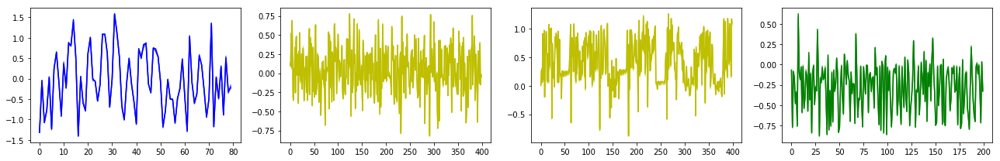


EPSILON = 0.9
Iteration 16:  TOKYO, 2009 
Average Reward 		= -2.565
Battery Violations 	= 315
Action Mean = 3.468
Action variance = 7.582


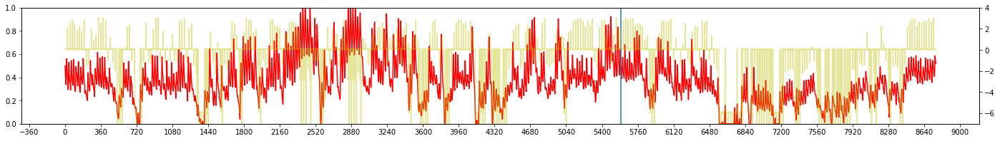

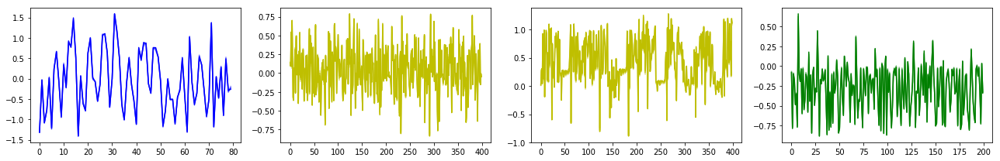


EPSILON = 0.9
Iteration 17:  TOKYO, 2007 
Average Reward 		= -2.910
Battery Violations 	= 548
Action Mean = 3.007
Action variance = 6.452


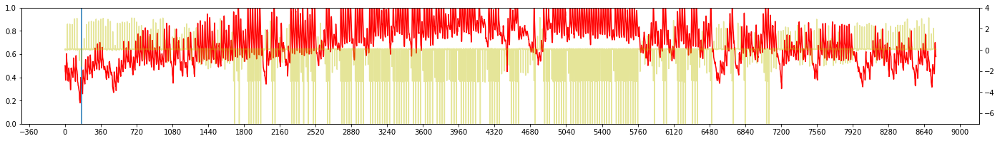

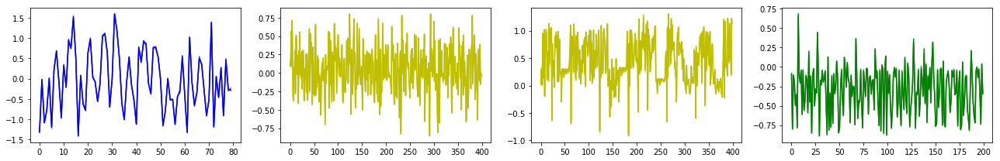


EPSILON = 0.9
Iteration 18:  TOKYO, 2000 
Average Reward 		= -1.301
Battery Violations 	= 196
Action Mean = 3.241
Action variance = 6.147


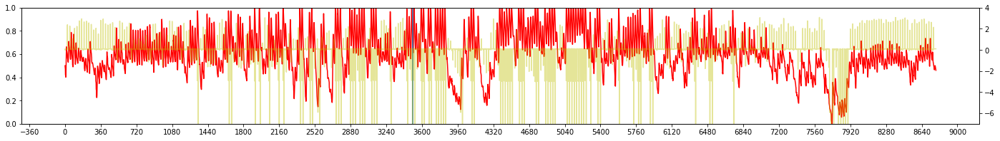

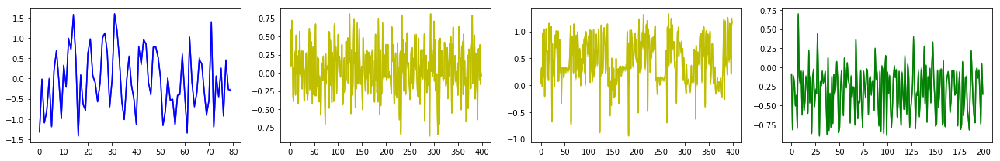


EPSILON = 0.9
Iteration 19:  TOKYO, 2000 
Average Reward 		= -2.122
Battery Violations 	= 269
Action Mean = 3.213
Action variance = 8.361


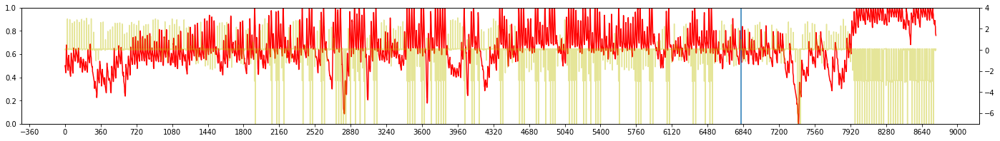

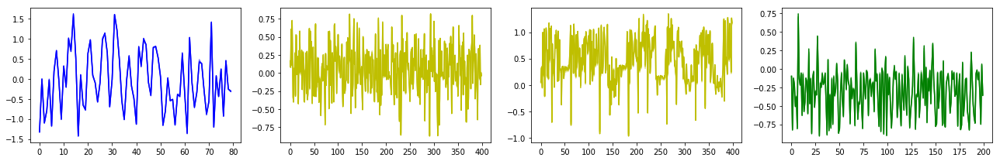


EPSILON = 0.9
Iteration 20:  TOKYO, 2004 
Average Reward 		= -1.665
Battery Violations 	= 560
Action Mean = 3.837
Action variance = 9.227


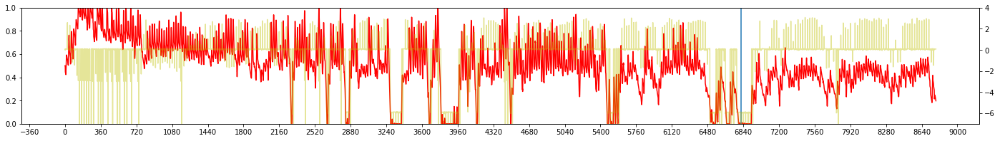

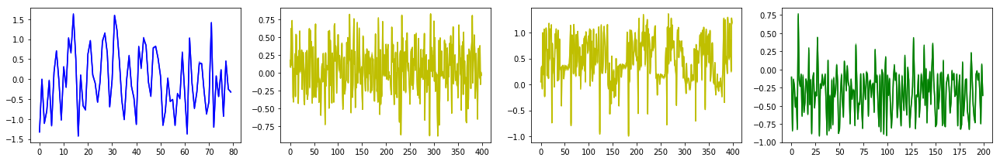


EPSILON = 0.9
Iteration 21:  TOKYO, 2008 
Average Reward 		= -1.534
Battery Violations 	= 138
Action Mean = 3.292
Action variance = 8.601


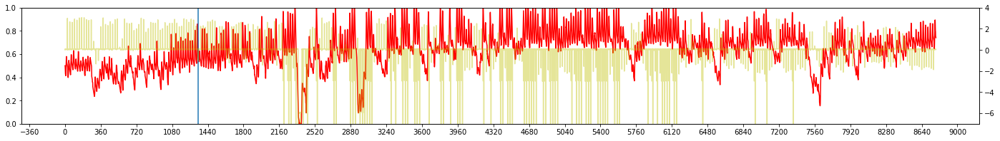

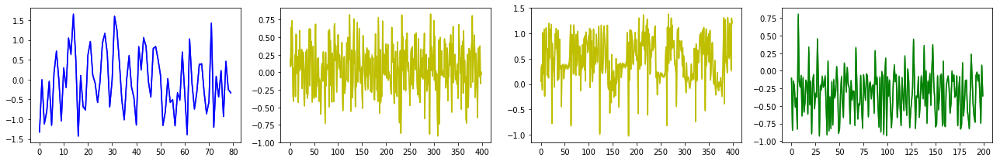


EPSILON = 0.9
Iteration 22:  TOKYO, 2004 
Average Reward 		= -3.377
Battery Violations 	= 380
Action Mean = 3.354
Action variance = 9.028


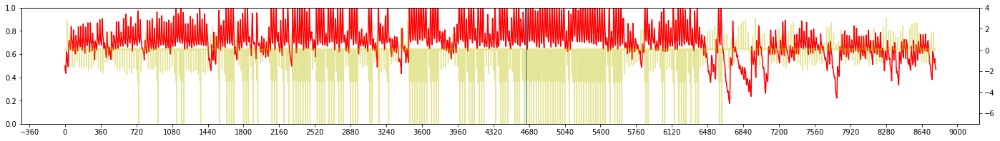

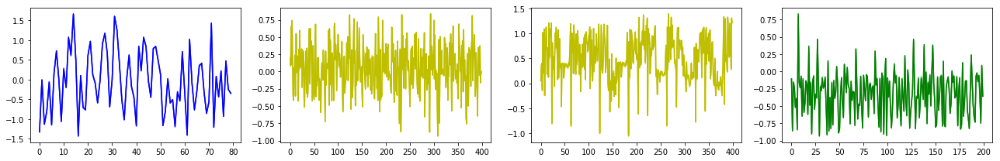


EPSILON = 0.9
Iteration 23:  TOKYO, 2006 
Average Reward 		= -2.156
Battery Violations 	= 782
Action Mean = 3.721
Action variance = 11.232


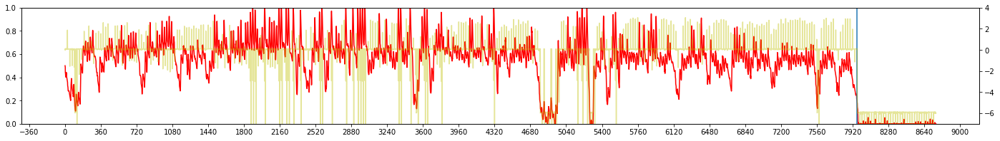

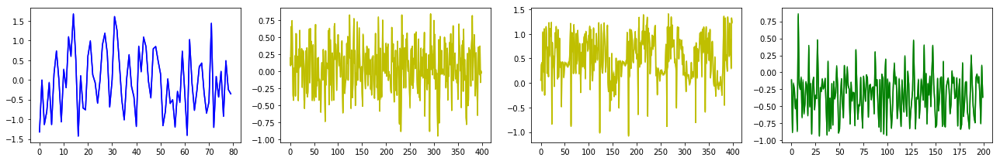


EPSILON = 0.9
Iteration 24:  TOKYO, 2007 
Average Reward 		= -2.073
Battery Violations 	= 867
Action Mean = 4.202
Action variance = 10.941


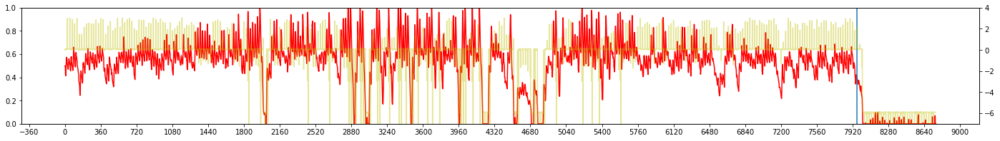

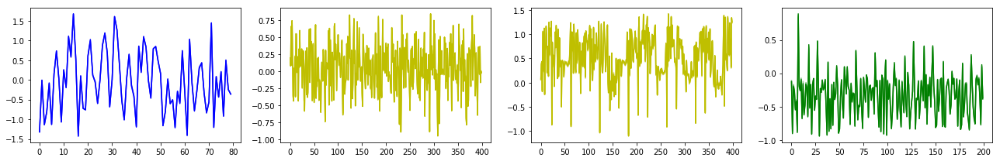


EPSILON = 0.9
Iteration 25:  TOKYO, 2003 
Average Reward 		= -0.087
Battery Violations 	= 163
Action Mean = 3.221
Action variance = 8.581


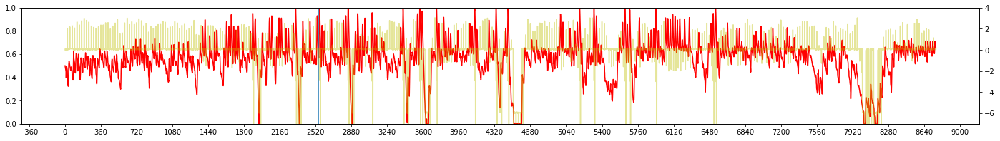

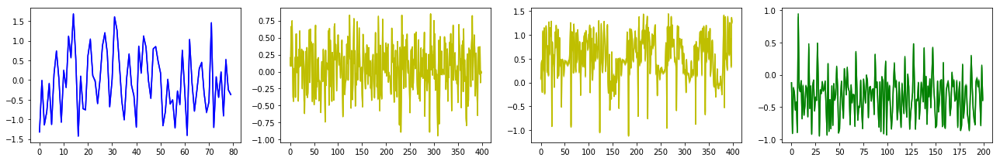


EPSILON = 0.9
Iteration 26:  TOKYO, 2005 
Average Reward 		= -1.452
Battery Violations 	= 131
Action Mean = 3.321
Action variance = 8.511


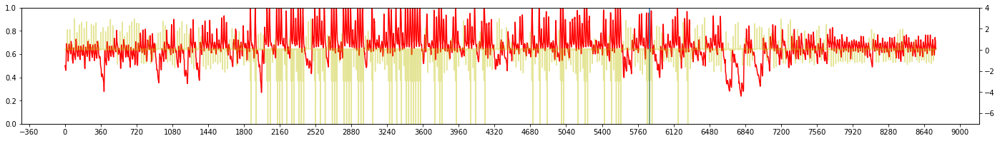

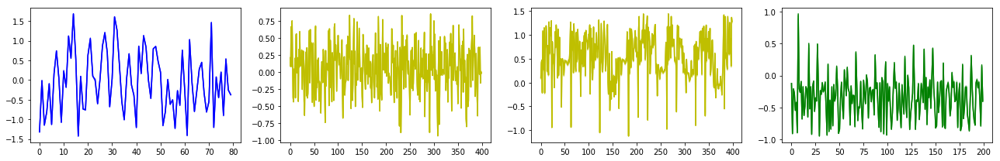


EPSILON = 0.9
Iteration 27:  TOKYO, 2007 
Average Reward 		= -1.811
Battery Violations 	= 163
Action Mean = 3.394
Action variance = 8.747


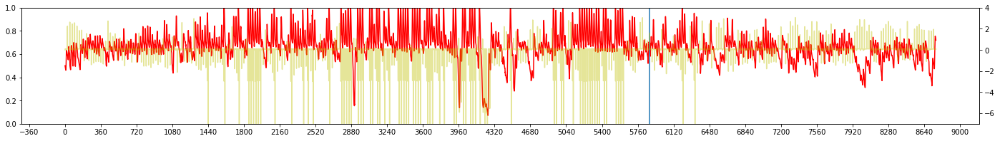

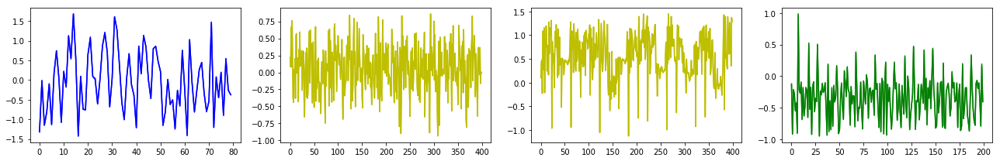


EPSILON = 0.9
Iteration 28:  TOKYO, 2008 
Average Reward 		= -1.322
Battery Violations 	= 107
Action Mean = 3.298
Action variance = 8.201


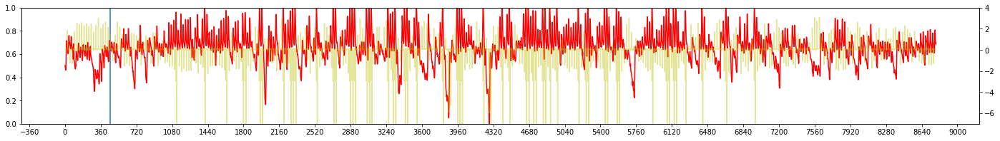

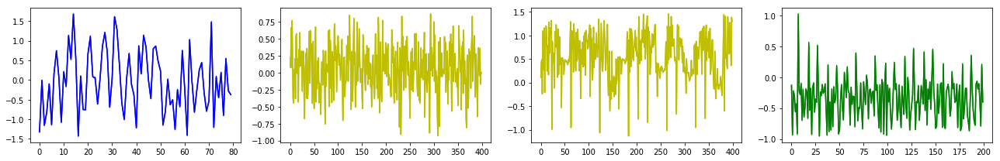


EPSILON = 0.9
Iteration 29:  TOKYO, 2004 
Average Reward 		= -3.195
Battery Violations 	= 537
Action Mean = 3.666
Action variance = 7.130


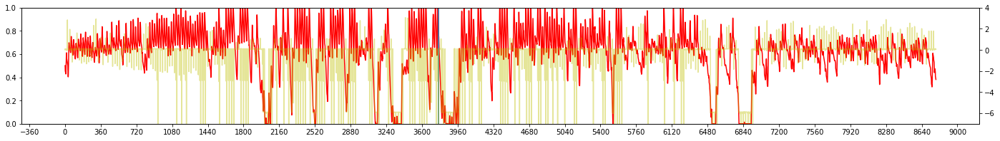

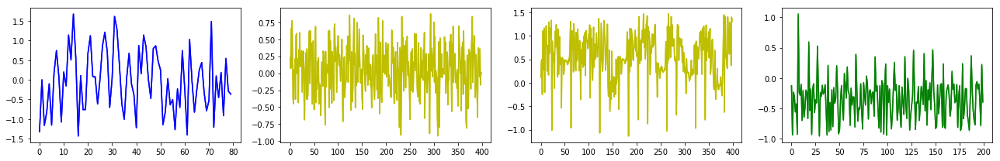


EPSILON = 0.9
Iteration 30:  TOKYO, 2006 
Average Reward 		= -3.081
Battery Violations 	= 663
Action Mean = 3.323
Action variance = 8.373


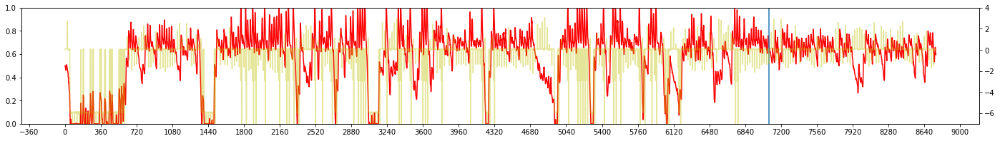

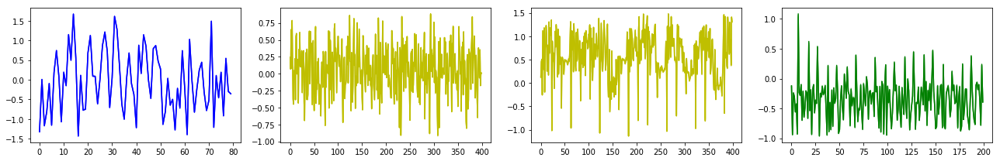


EPSILON = 0.9
Iteration 31:  TOKYO, 2002 
Average Reward 		= -2.571
Battery Violations 	= 224
Action Mean = 3.228
Action variance = 8.250


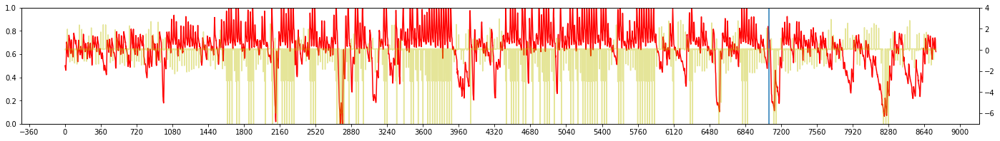

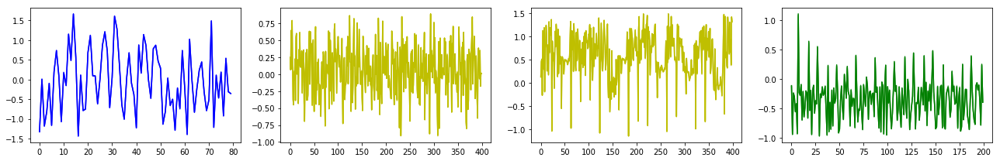


EPSILON = 0.9
Iteration 32:  TOKYO, 2007 
Average Reward 		= -2.434
Battery Violations 	= 224
Action Mean = 3.330
Action variance = 8.666


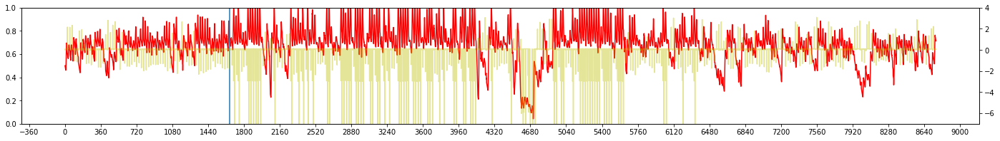

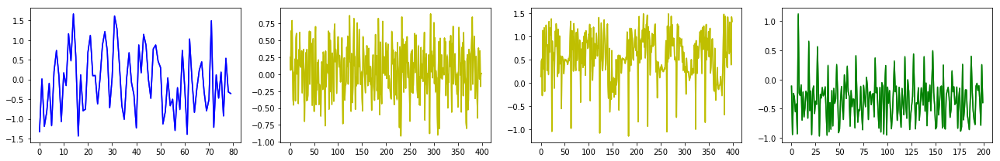


EPSILON = 0.9
Iteration 33:  TOKYO, 2000 
Average Reward 		= -3.950
Battery Violations 	= 752
Action Mean = 3.669
Action variance = 8.373


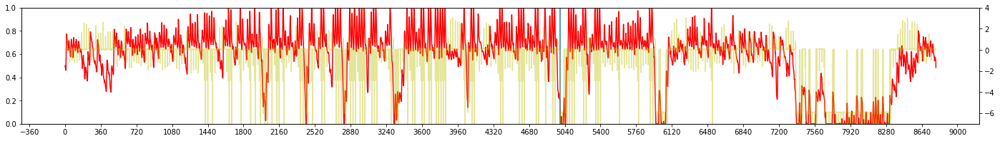

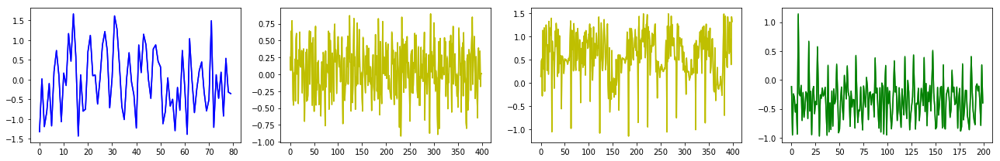


EPSILON = 0.9
Iteration 34:  TOKYO, 2007 
Average Reward 		= -2.226
Battery Violations 	= 178
Action Mean = 3.361
Action variance = 8.615


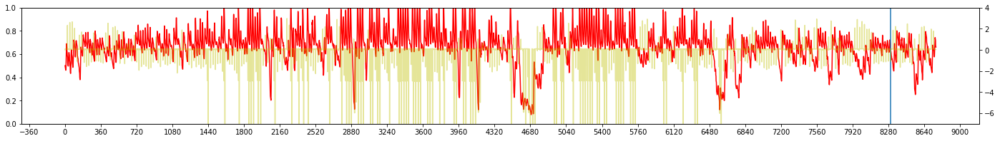

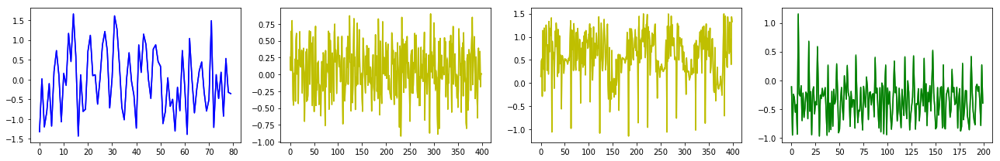


EPSILON = 0.9
Iteration 35:  TOKYO, 2002 
Average Reward 		= -2.715
Battery Violations 	= 260
Action Mean = 3.197
Action variance = 7.705


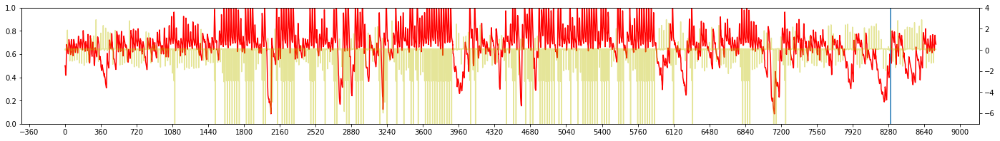

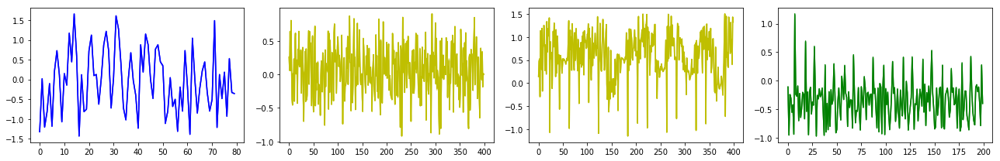


EPSILON = 0.9
Iteration 36:  TOKYO, 2003 
Average Reward 		= -2.492
Battery Violations 	= 202
Action Mean = 3.008
Action variance = 7.879


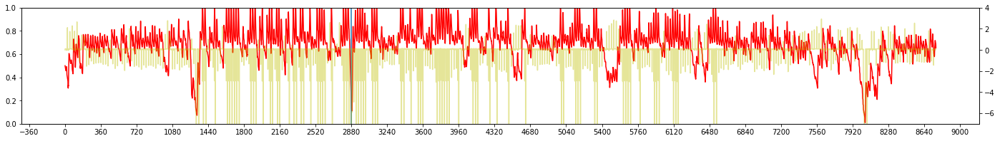

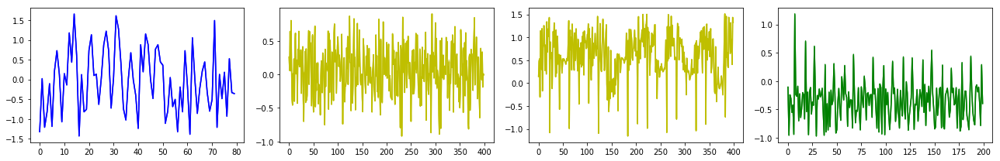


EPSILON = 0.9
Iteration 37:  TOKYO, 2006 
Average Reward 		= -1.543
Battery Violations 	= 242
Action Mean = 3.252
Action variance = 10.644


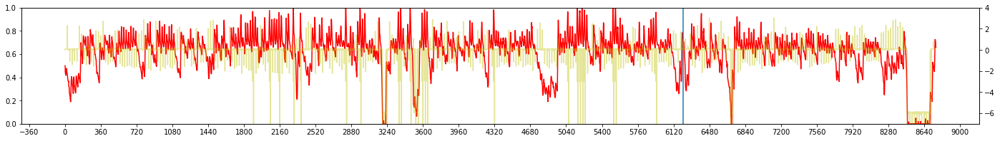

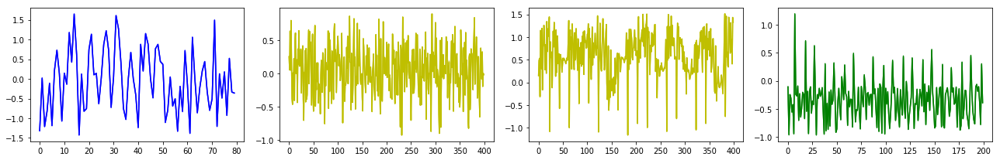


EPSILON = 0.9
Iteration 38:  TOKYO, 2004 
Average Reward 		= -2.278
Battery Violations 	= 367
Action Mean = 3.662
Action variance = 8.672


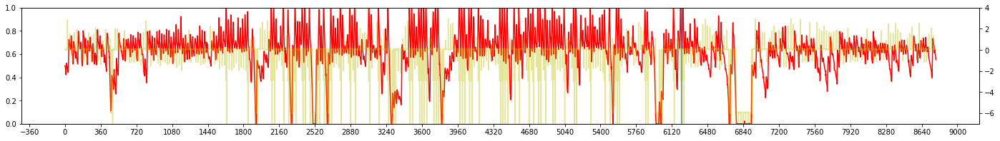

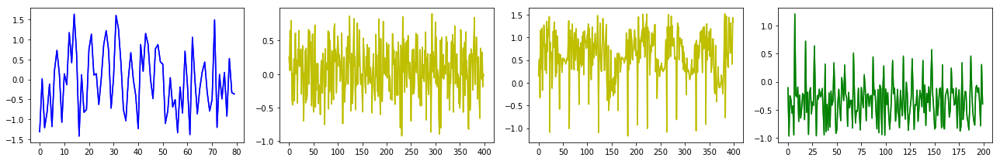


EPSILON = 0.9
Iteration 39:  TOKYO, 2008 
Average Reward 		= -1.429
Battery Violations 	= 93
Action Mean = 3.335
Action variance = 8.648


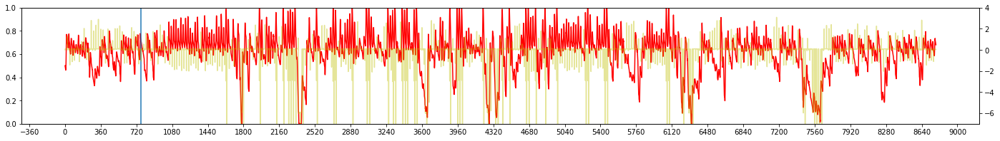

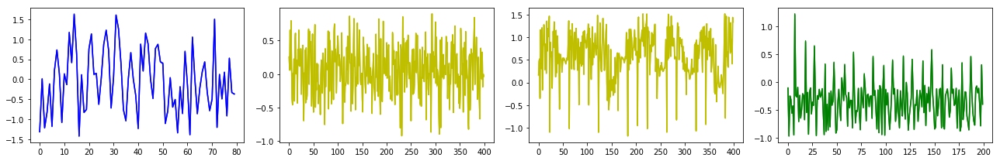


EPSILON = 0.9
Iteration 40:  TOKYO, 2006 
Average Reward 		= -1.256
Battery Violations 	= 85
Action Mean = 3.016
Action variance = 8.084


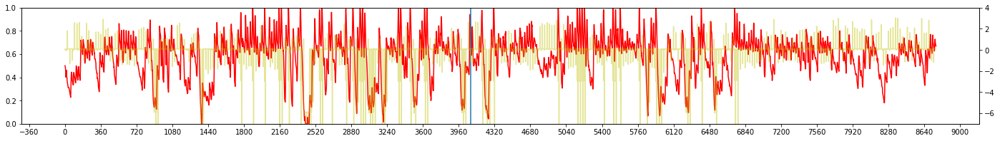

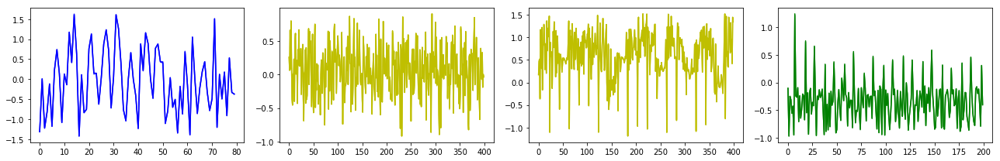


EPSILON = 0.9
Iteration 41:  TOKYO, 2000 
Average Reward 		= -2.393
Battery Violations 	= 297
Action Mean = 3.196
Action variance = 7.569


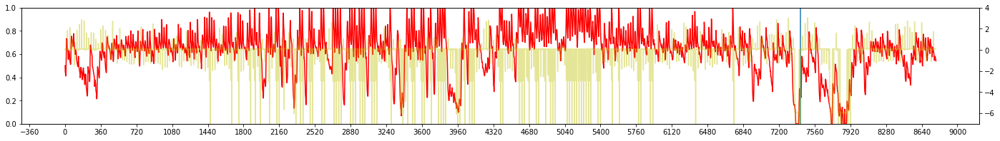

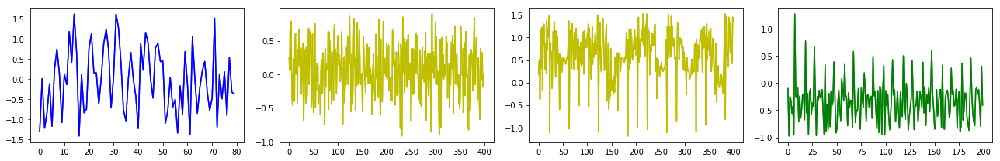


EPSILON = 0.9
Iteration 42:  TOKYO, 2000 
Average Reward 		= -1.759
Battery Violations 	= 96
Action Mean = 3.362
Action variance = 8.690


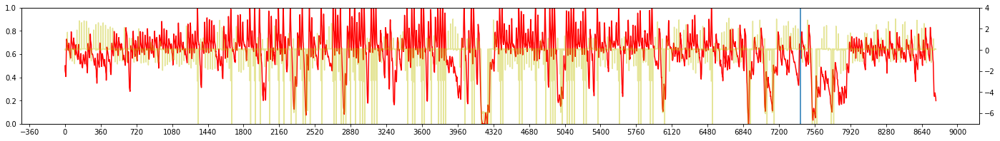

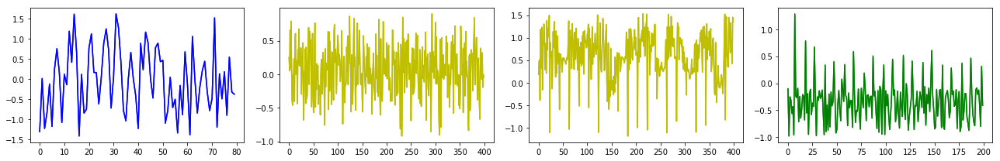


EPSILON = 0.9
Iteration 43:  TOKYO, 2004 
Average Reward 		= -2.392
Battery Violations 	= 166
Action Mean = 3.534
Action variance = 8.740


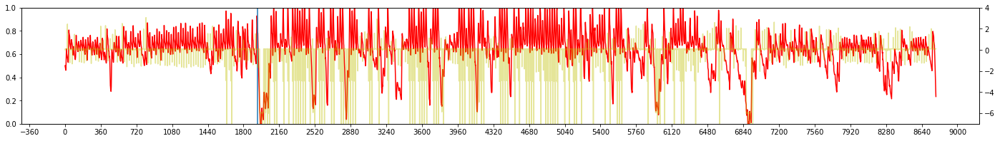

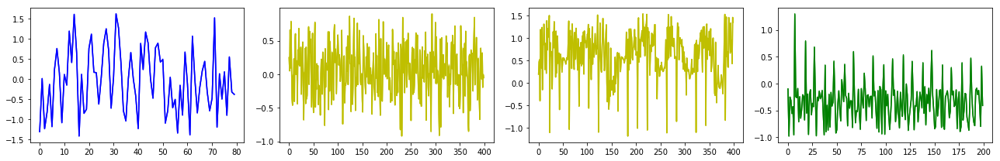


EPSILON = 0.9
Iteration 44:  TOKYO, 2008 
Average Reward 		= -1.703
Battery Violations 	= 116
Action Mean = 3.327
Action variance = 8.548


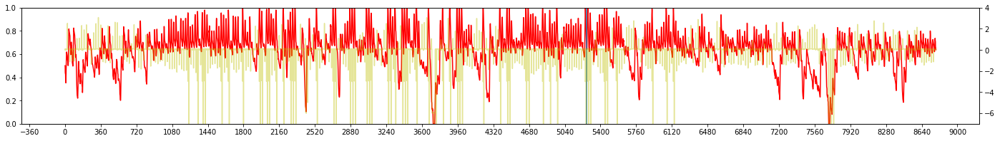

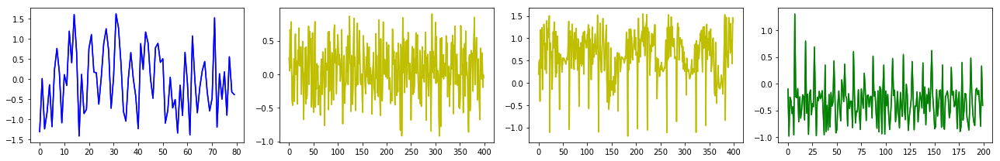


EPSILON = 0.9
Iteration 45:  TOKYO, 2007 
Average Reward 		= -2.197
Battery Violations 	= 289
Action Mean = 3.241
Action variance = 7.617


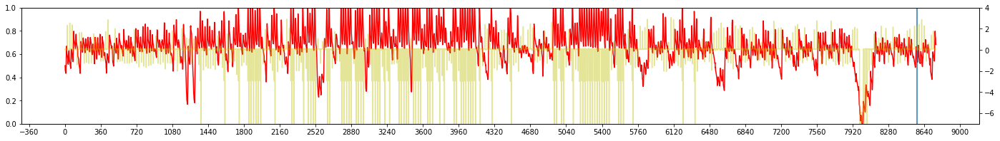

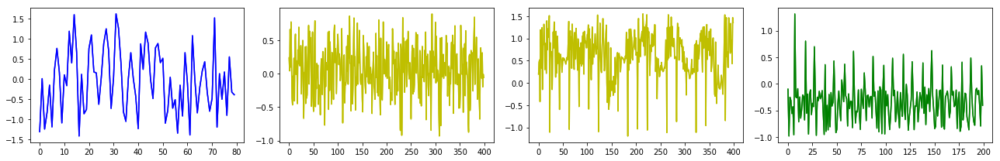


EPSILON = 0.9
Iteration 46:  TOKYO, 2009 
Average Reward 		= -1.444
Battery Violations 	= 81
Action Mean = 3.285
Action variance = 8.550


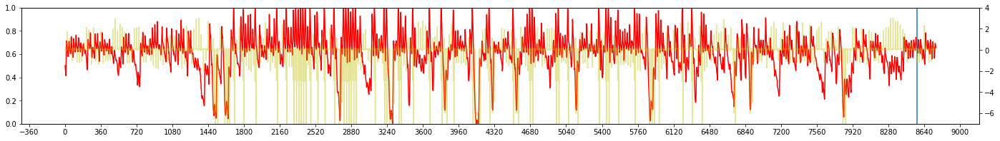

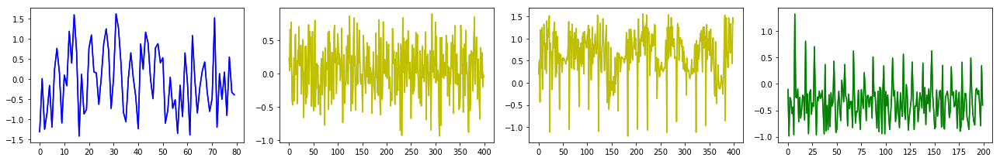


EPSILON = 0.9
Iteration 47:  TOKYO, 2003 
Average Reward 		= -1.922
Battery Violations 	= 268
Action Mean = 3.160
Action variance = 10.382


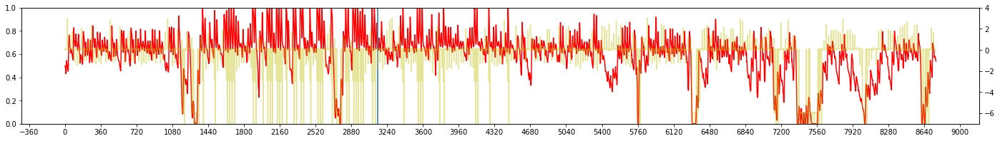

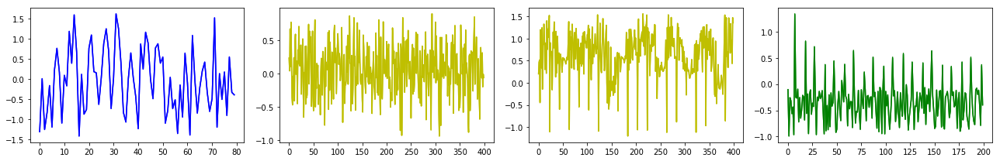


EPSILON = 0.9
Iteration 48:  TOKYO, 2007 
Average Reward 		= -0.970
Battery Violations 	= 267
Action Mean = 3.602
Action variance = 13.516


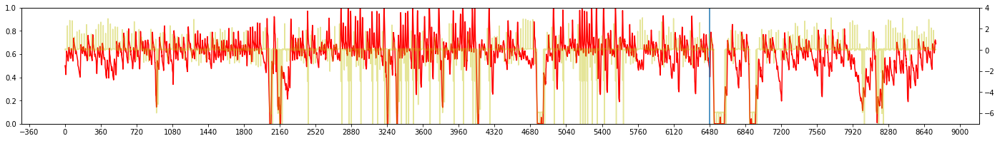

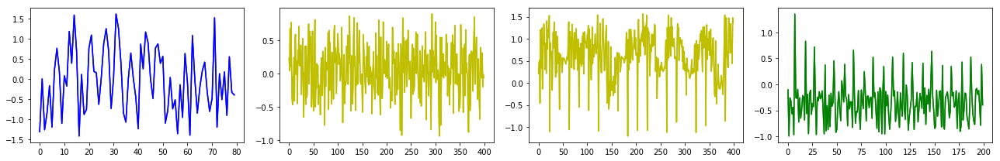


EPSILON = 0.9
Iteration 49:  TOKYO, 2009 
Average Reward 		= -1.123
Battery Violations 	= 188
Action Mean = 3.426
Action variance = 13.258


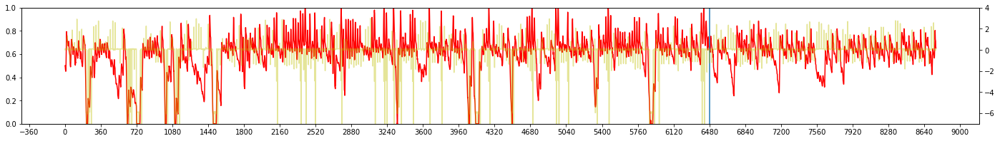

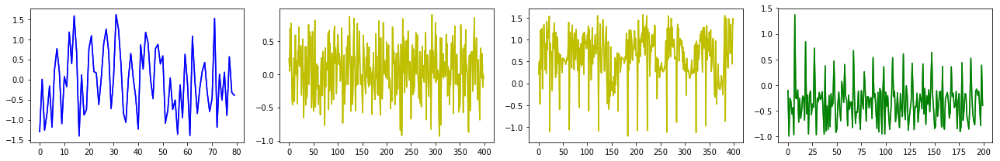

In [9]:
#TRAIN 
dqn = DQN()
# for recording weights
oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
old2fc1 = oldfc1

oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
old2fc2 = oldfc2

oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
old2fc3 = oldfc3

oldout = dqn.eval_net.out.weight.data.cpu().numpy().flatten()
old2out = oldout
########################################

best_iteration = -1
best_avg_reward = -1000 #initialize best average reward to very low value
reset_counter = 0 #count number of times the battery had to be reset
change_hr = 0
# PFILENAME = ''.join(random.choice(string.ascii_uppercase + string.digits) for _ in range(8)) #create random filename
# BFILENAME = "best"+PFILENAME + ".pt" #this file stores the best model
# TFILENAME = "terminal"+PFILENAME + ".pt" #this file stores the last model

avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
violation_rec = []
print('\nTRAINING IN PROGRESS\n')
print('Device: ', dqn.device)

for iteration in range(NO_OF_ITERATIONS):
    slope = 7
    start = 0.5
    inflection_point = 30 #EPSILON = start*(1 + 1/(1+1)) = 0.75 @ iteration=inflection_point
#     EPSILON = start + start/(1 + np.exp(-(iteration-inflection_point)/slope))
    print('\nEPSILON = {:.2}'.format(EPSILON))

    LOCATION = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR = random.choice(np.arange(2000,2010))
    capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object
#     clear_output()
    print('Iteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))

    s, r, day_end, year_end = capm.reset()
    yr_record = np.empty(4)

    record = np.empty(4) #record for battery, henergy, reward and action
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(stdize(s))

        # present state = [batt, enp, henergy]
        record = np.vstack((record, [s[0],s[2],r, a])) # record battery, henergy, reward and action for troubleshooting
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))

        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5] += r #broadcast reward to all states
            decay_factor = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5] = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    record = np.delete(record, 0, 0) #remove the first row which is garbage
    reward_rec = record[:,2] #extract reward information from the record array
    reward_rec = reward_rec[::24] #only consider terminal rewards
    print("Average Reward \t\t= {:.3f}".format(np.mean(reward_rec)))
    print("Battery Violations \t= {}".format(capm.batt_violations))

    
    # Log the average reward in avg_reward_rec
    avg_reward_rec = np.append(avg_reward_rec, np.mean(reward_rec))
    violation_rec = np.append(violation_rec, capm.batt_violations)

###########################################################################################
#   PLOT battery levels, hourly rewards and the weights
    yr_record = np.delete(yr_record, 0, 0) #remove the first row which is garbage
#     NO_OF_DAYS = capm.eno.NO_OF_DAYS
    hourly_yr_reward_rec = yr_record[:,2]
    yr_reward_rec = hourly_yr_reward_rec[::24]

    print("Action Mean = {:.3f}".format(np.mean(yr_record[:,-1] + 1)))
    print("Action variance = {:.3f}".format(np.var(yr_record[:,-1] + 1)))
    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    #plot battery
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),yr_record[:,0],'r')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))
#     labels = [item for item in ax.get_xticklabels()]
#     print(labels)
#     labels [15:-1] = np.arange(0,NO_OF_DAYS,DAY_SPACING) #the first label is reserved to negative values
#     ax.set_xticklabels(labels)
    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
    ax0.set_ylim(-7,4)
    plt.show()


    fig = plt.figure(figsize=(18,3))
    ax1 = fig.add_subplot(141)
    newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
    ax1.plot(old2fc1,color='b', alpha=0.4)
    ax1.plot(oldfc1,color='b',alpha = 0.7)
    ax1.plot(newfc1,color='b')
    old2fc1 = oldfc1
    oldfc1 = newfc1
    
    ax2 = fig.add_subplot(142)
    newfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
    ax2.plot(old2fc2,color='y', alpha=0.4)
    ax2.plot(oldfc2,color='y',alpha = 0.7)
    ax2.plot(newfc2,color='y')
    old2fc2 = oldfc2
    oldfc2 = newfc2
    
    ax3 = fig.add_subplot(143)
    newfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
    ax3.plot(old2fc3,color='y', alpha=0.4)
    ax3.plot(oldfc3,color='y',alpha = 0.7)
    ax3.plot(newfc3,color='y')
    old2fc3 = oldfc3
    oldfc3 = newfc3
    
    axO = fig.add_subplot(144)
    newout = dqn.eval_net.out.weight.data.cpu().numpy().flatten()
    axO.plot(old2out,color='g', alpha=0.4)
    axO.plot(oldout,color='g',alpha=0.7)
    axO.plot(newout,color='g')
    old2out = oldout
    oldout = newout
    
    fig.tight_layout()
    plt.show()


    # End of training

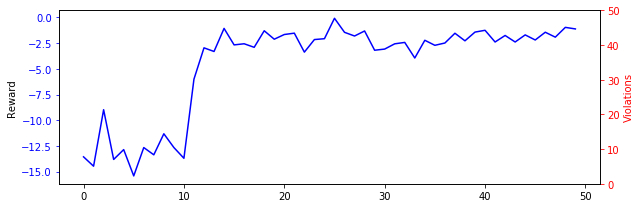

In [10]:
fig = plt.figure(figsize=(9,3))
# Plot the average reward log

ax1 = fig.add_subplot(111)
ax1.set_ylabel("Reward")
# ax1.set_ylim([-3,3]);
ax1.plot(avg_reward_rec,'b')
ax1.tick_params(axis='y', colors='b')

#Plot the violation record log
ax2 = ax1.twinx()
ax2.set_ylabel("Violations",color = 'r')
ax2.plot(violation_rec,'r')
for xpt in np.argwhere(violation_rec<1):
    ax2.axvline(x=xpt,color='g')
ax2.set_ylim([0,50]);
ax2.tick_params(axis='y', colors='r')

fig.tight_layout()

In [11]:
#END OF TRAINING PHASE - CHOOSING THE BEST MODEL INSTANCE
#INCREASE GREEDY RATE
#VALIDATE AFTER EVERY ITERATION

# Use this model and its output as base standards for the last phase of training
best_avg_avg_reward = -1000
best_net_avg_reward = dqn.eval_net
best_avg_v_counter = 1000
best_net_v_counter = dqn.eval_net


NO_OF_LAST_PHASE_ITERATIONS = 30
for iteration in range(NO_OF_LAST_PHASE_ITERATIONS):
    slope = 7
    start = 0.5
    inflection_point = 30 #EPSILON = start*(1 + 1/(1+1)) = 0.75 @ iteration=inflection_point
    EPSILON = start + start/(1 + np.exp(-(iteration+NO_OF_ITERATIONS-inflection_point)/slope))
    print('\nEPSILON = {:.2}'.format(EPSILON))
    
    
    LOCATION = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR = random.choice(np.arange(2000,2010))
    capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    print('\nLAST PHASE ITERATION #{}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    
    
    my_avg_reward = -1000
    my_v_counter = 1000
    
    s, r, day_end, year_end = capm.reset()
    yr_record = np.empty(4)

    record = np.empty(4) #record for battery, henergy, reward and action
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(stdize(s))

        # present state = [batt, enp, henergy]
        record = np.vstack((record, [s[0],s[2],r, a])) # record battery, henergy, reward and action for troubleshooting
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))

        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5] += r #broadcast reward to all states
            decay_factor = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5] = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    record = np.delete(record, 0, 0) #remove the first row which is garbage
    reward_rec = record[:,2] #extract reward information from the record array
    reward_rec = reward_rec[::24] #only consider terminal rewards
    print("Average Reward \t\t= {:.3f}".format(np.mean(reward_rec)))
    print("Battery Violations \t= {}".format(capm.batt_violations))
    
     # Log the average reward in avg_reward_rec
    avg_reward_rec = np.append(avg_reward_rec, np.mean(reward_rec))
    violation_rec = np.append(violation_rec, capm.batt_violations)
    
    print("***MEASURING PERFORMANCE OF THE MODEL***")
    print("\tBEST AVERAGE ANNUAL AVERAGE REWARD = {:.3f}".format(best_avg_avg_reward))
    print("\tMINIMUM BATT VIOLATIONS           = {}".format(best_avg_v_counter))
    LOCATION = 'tokyo'
    results = np.empty(3)
    for YEAR in np.arange(2000,2018):
        capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            #state = [batt, enp, henergy, fcast]
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            # take action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.batt_violations)]))
    results = np.delete(results,0,0)
    my_avg_reward = np.mean(results[:,1]) #the average of annual average rewards
    my_v_counter = np.sum(results[:,-1]) #total sum of violations
    print("\n\tAverage Annual Average Reward      = {:.3f}".format(my_avg_reward))
    print("\tTotal Violations                   = {}".format(my_v_counter))

    if (my_avg_reward > best_avg_avg_reward):
            best_avg_avg_reward = my_avg_reward
            best_net_avg_reward = dqn.eval_net

    if (my_v_counter < best_avg_v_counter):
        best_avg_v_counter = my_v_counter
        best_net_v_counter = dqn.eval_net
    elif (my_v_counter == best_avg_v_counter):
        if (my_avg_reward > best_avg_avg_reward):
            best_avg_v_counter = my_v_counterO
            best_net_v_counter = dqn.eval_net
    print("****************************************")

    


    


EPSILON = 0.97

LAST PHASE ITERATION #0:  TOKYO, 2000 
Average Reward 		= -1.506
Battery Violations 	= 127
***MEASURING PERFORMANCE OF THE MODEL***
	BEST AVERAGE ANNUAL AVERAGE REWARD = -1000.000
	MINIMUM BATT VIOLATIONS           = 1000

	Average Annual Average Reward      = -0.746
	Total Violations                   = 766.0
****************************************

EPSILON = 0.98

LAST PHASE ITERATION #1:  TOKYO, 2004 
Average Reward 		= -2.917
Battery Violations 	= 753
***MEASURING PERFORMANCE OF THE MODEL***
	BEST AVERAGE ANNUAL AVERAGE REWARD = -0.746
	MINIMUM BATT VIOLATIONS           = 766.0

	Average Annual Average Reward      = -1.561
	Total Violations                   = 7583.0
****************************************

EPSILON = 0.98

LAST PHASE ITERATION #2:  TOKYO, 2008 
Average Reward 		= -2.018
Battery Violations 	= 476
***MEASURING PERFORMANCE OF THE MODEL***
	BEST AVERAGE ANNUAL AVERAGE REWARD = -0.746
	MINIMUM BATT VIOLATIONS           = 766.0

	Average Annual Average

In [12]:
print('Device: ', dqn.device)
print('Train time: {}'.format(datetime.now() - tic))

Device:  cpu
Train time: 0:51:58.908220


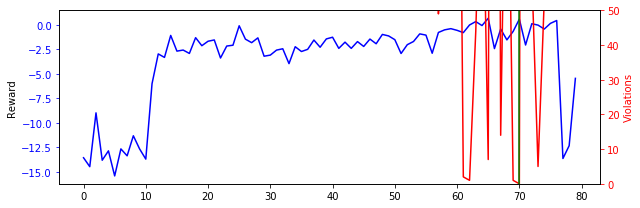

In [13]:
fig = plt.figure(figsize=(9,3))
# Plot the average reward log

ax1 = fig.add_subplot(111)
ax1.set_ylabel("Reward")
# ax1.set_ylim([-3,3]);
ax1.plot(avg_reward_rec,'b')
ax1.tick_params(axis='y', colors='b')

#Plot the violation record log
ax2 = ax1.twinx()
ax2.set_ylabel("Violations",color = 'r')
ax2.plot(violation_rec,'r')
for xpt in np.argwhere(violation_rec<1):
    ax2.axvline(x=xpt,color='g')
ax2.set_ylim([0,50]);
ax2.tick_params(axis='y', colors='r')

fig.tight_layout()

In [14]:
dqn.eval_net = best_net_avg_reward
FILENAME = 'G7_' + str(seed)
FILENAME = FILENAME + '.pt'
torch.save(dqn.eval_net.state_dict(), FILENAME)

In [15]:
#TESTING BEST MODEL BASED ON AVERAGE REWARD METRIC
dqn = DQN()
dqn.eval_net = best_net_avg_reward
LOCATION = 'tokyo'
results = np.empty(3)
for YEAR in np.arange(2000,2019):
    capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))

        #state = [batt, enp, henergy, fcast]
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, day_end, year_end = capm.step(a)

        if year_end:
            break

        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage

#     #Plot the reward and battery for the entire year run
#     title = LOCATION.upper() + ',' + str(YEAR)

#     NO_OF_DAYS = capm.eno.NO_OF_DAYS
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24]
#     print('Average Reward for',title, '=', np.mean(yr_test_reward_rec))
#     print('Violations for',title, '=', capm.violation_counter)
    
    results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.batt_violations)]))

#     fig = plt.figure(figsize=(24,3))
#     fig.suptitle(title, fontsize=15)

#     #     ax1 = fig.add_subplot(211)
#     #     ax1.plot(yr_test_reward_rec)
#     #     ax1.set_title("\n\nYear Run Reward")
#     #     ax1.set_ylim([-3,1])

#     ax2 = fig.add_subplot(111)
#     ax2.plot(yr_test_record[:,0],'r')
#     ax2.set_title("\n\nYear Run Battery")
#     ax2.set_ylim([0,1])
#     plt.sca(ax2)
#     plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))

#     fig.tight_layout()
#     plt.show()

results = np.delete(results,0,0)

print("TESTING BEST MODEL BASED ON AVERAGE REWARD METRIC")
print('YEAR\t\tAVG_RWD\t\tVIOLATIONS')
for x in np.arange(0,results.shape[0]):
    print('{} \t\t {} \t\t {}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,-1])))

TESTING BEST MODEL BASED ON AVERAGE REWARD METRIC
YEAR		AVG_RWD		VIOLATIONS
2000 		 -3.42 		 622
2001 		 -1.2 		 51
2002 		 -3.77 		 916
2003 		 -3.58 		 833
2004 		 -6.04 		 1619
2005 		 -4.78 		 1060
2006 		 -8.65 		 2244
2007 		 -2.92 		 575
2008 		 -1.5 		 159
2009 		 -2.85 		 515
2010 		 -2.15 		 261
2011 		 -9.46 		 2289
2012 		 -2.83 		 400
2013 		 -1.73 		 112
2014 		 -3.41 		 643
2015 		 -2.07 		 318
2016 		 -2.56 		 386
2017 		 -9.83 		 2537
2018 		 -8.22 		 2174


In [16]:
#TESTING BASED ON VIOLATION COUNTER METRIC
dqn = DQN()
dqn.eval_net = best_net_v_counter

LOCATION = 'tokyo'
results = np.empty(3)
for YEAR in np.arange(2000,2019):
    capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))

        #state = [batt, enp, henergy, fcast]
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, day_end, year_end = capm.step(a)

        if year_end:
            break

        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage

#     #Plot the reward and battery for the entire year run
#     title = LOCATION.upper() + ',' + str(YEAR)

#     NO_OF_DAYS = capm.eno.NO_OF_DAYS
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24]
#     print('Average Reward for',title, '=', np.mean(yr_test_reward_rec))
#     print('Violations for',title, '=', capm.violation_counter)
    
    results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.batt_violations)]))

#     fig = plt.figure(figsize=(24,3))
#     fig.suptitle(title, fontsize=15)

#     #     ax1 = fig.add_subplot(211)
#     #     ax1.plot(yr_test_reward_rec)
#     #     ax1.set_title("\n\nYear Run Reward")
#     #     ax1.set_ylim([-3,1])

#     ax2 = fig.add_subplot(111)
#     ax2.plot(yr_test_record[:,0],'r')
#     ax2.set_title("\n\nYear Run Battery")
#     ax2.set_ylim([0,1])
#     plt.sca(ax2)
#     plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))

#     fig.tight_layout()
#     plt.show()

results = np.delete(results,0,0)

print("TESTING BASED ON VIOLATION COUNTER METRIC")
print('YEAR\t\tAVG_RWD\t\tVIOLATIONS')
for x in np.arange(0,results.shape[0]):
    print('{} \t\t {} \t\t {}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,-1])))

TESTING BASED ON VIOLATION COUNTER METRIC
YEAR		AVG_RWD		VIOLATIONS
2000 		 -3.42 		 622
2001 		 -1.2 		 51
2002 		 -3.77 		 916
2003 		 -3.58 		 833
2004 		 -6.04 		 1619
2005 		 -4.78 		 1060
2006 		 -8.65 		 2244
2007 		 -2.92 		 575
2008 		 -1.5 		 159
2009 		 -2.85 		 515
2010 		 -2.15 		 261
2011 		 -9.46 		 2289
2012 		 -2.83 		 400
2013 		 -1.73 		 112
2014 		 -3.41 		 643
2015 		 -2.07 		 318
2016 		 -2.56 		 386
2017 		 -9.83 		 2537
2018 		 -8.22 		 2174


In [17]:
print('Total runtime: {}'.format(datetime.now() - tic))

Total runtime: 0:53:47.641175
